<a href="https://colab.research.google.com/github/leenAbdulaziz-glitch/Lost-Child-Finder/blob/main/Lost_Child_Finder.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Lost Child Finder
---

##Lost Child Detection System using YOLOv8 + ByteTrack

Project Idea:
This system is designed to detect and track children and adults in real-time video streams.
It aims to identify when a child becomes separated from their corresponding adult guardian.

Core Logic:
1. Detect all persons in each video frame using a YOLOv8 object detection model.
2. Classify detected objects into two categories: Child and Adult.
3. Track each individual using ByteTrack to assign a unique ID over time.
4. Pair each child with the nearest adult when first detected (assumed guardian).
5. Continuously calculate the distance between each child and their assigned adult.
6. Convert pixel distance into an estimated real-world distance (meters).

Alert System Logic:
- SAFE STATE (🟢): distance ≤ 2.0 meters → child is considered safe.
- WARNING STATE (🟡): 2.0m < distance ≤ 2.5m → child is moving away.
- ALERT STATE (🔴): distance > 2.5 meters → child is considered lost/separated.

Output Visualization:
- Green bounding box → safe child/adult
- Yellow/Orange → increasing distance
- Red box + ALERT label → child is lost
- Line between child and adult shows relationship

Goal:
Improve public safety by providing early detection of child separation in crowded environments such as malls, parks, and events.


---

##Dataset :
- Children vs Adults (2024) : Roboflow | 999 image | [Children vs Adults yolo Computer Vision Model](https://universe.roboflow.com/a-4euhx/children-vs-adults-yolo-my3ct)

- Children vs Adults (2025) : Roboflow | 797 image | [Children vs Adults yolo Computer Vision Model](https://universe.roboflow.com/aghababa/children-vs-adults-yolo-nwudf)

In [ ]:
# 1. التثبيت
!pip install ultralytics supervision opencv-python numpy


!pip install supervision==0.21.0


import supervision as sv

print(sv.__version__)
print(hasattr(sv, "ByteTracker"))

0.21.0
False


In [ ]:
from roboflow import Roboflow

rf = Roboflow(api_key="u3MhbecKJgDPA72y5geC")

print("Connected!")

Connected!


In [ ]:
!pip install ultralytics roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="u3MhbecKJgDPA72y5geC")
project = rf.workspace("a-4euhx").project("children-vs-adults-yolo-my3ct")
dataset = project.version(4).download("yolov8")

from ultralytics import YOLO
model = YOLO("/content/best.pt")




loading Roboflow workspace...
loading Roboflow project...


In [ ]:
import argparse
import sys
import time
import warnings
from collections import defaultdict
from pathlib import Path

import cv2
import numpy as np

warnings.filterwarnings("ignore")

In [ ]:
#colors

COLOR_CHILD       = (0,   200, 255)   # أصفر-برتقالي
COLOR_ADULT       = (50,  220,  80)   # أخضر
COLOR_ALERT       = (0,    40, 230)   # أحمر
COLOR_LINE_OK     = (50,  220,  80)   # أخضر — خط الربط عادي
COLOR_LINE_ALERT  = (0,    40, 230)   # أحمر — خط الربط عند الخطر
COLOR_BG          = (20,   20,  20)   # خلفية النصوص


In [ ]:

def center(box):
    """مركز bounding box  [x1,y1,x2,y2]"""
    return np.array([(box[0] + box[2]) / 2, (box[1] + box[3]) / 2])


def box_height(box):
    """ارتفاع الـ bounding box"""
    return max(box[3] - box[1], 1)


def pixel_to_meters(pixel_dist, ref_height_px, real_person_height=1.7):
    """
    تحويل المسافة من بكسل إلى متر افتراضي.
    نفترض أن طول الشخص البالغ = 1.7 متر
    """
    return (pixel_dist / ref_height_px) * real_person_height


def draw_rounded_rect(img, x1, y1, x2, y2, color, radius=8, thickness=2):
    """رسم مستطيل بزوايا مدوّرة"""
    cv2.line(img, (x1 + radius, y1), (x2 - radius, y1), color, thickness)
    cv2.line(img, (x1 + radius, y2), (x2 - radius, y2), color, thickness)
    cv2.line(img, (x1, y1 + radius), (x1, y2 - radius), color, thickness)
    cv2.line(img, (x2, y1 + radius), (x2, y2 - radius), color, thickness)
    cv2.ellipse(img, (x1+radius, y1+radius), (radius,radius), 180,  0, 90, color, thickness)
    cv2.ellipse(img, (x2-radius, y1+radius), (radius,radius), 270,  0, 90, color, thickness)
    cv2.ellipse(img, (x1+radius, y2-radius), (radius,radius),  90,  0, 90, color, thickness)
    cv2.ellipse(img, (x2-radius, y2-radius), (radius,radius),   0,  0, 90, color, thickness)


def put_label(img, text, x, y, color, bg=COLOR_BG, scale=0.55, thickness=1):
    """كتابة نص مع خلفية"""
    font = cv2.FONT_HERSHEY_SIMPLEX
    (tw, th), bl = cv2.getTextSize(text, font, scale, thickness)
    cv2.rectangle(img, (x - 3, y - th - 4), (x + tw + 3, y + bl), bg, -1)
    cv2.putText(img, text, (x, y), font, scale, color, thickness, cv2.LINE_AA)


def draw_alert_banner(img, msg, frame_w):
    """شريط تنبيه أحمر في الأعلى"""
    h = 44
    overlay = img.copy()
    cv2.rectangle(overlay, (0, 0), (frame_w, h), (0, 0, 180), -1)
    img[:] = cv2.addWeighted(overlay, 0.82, img, 0.18, 0)
    font = cv2.FONT_HERSHEY_DUPLEX
    tw, _ = cv2.getTextSize(msg, font, 0.75, 2)[:2]
    x = (frame_w - tw[0]) // 2
    cv2.putText(img, msg, (x, 30), font, 0.75, (255, 255, 255), 2, cv2.LINE_AA)



In [ ]:
#فيديو تجريبي — للاختبار بدون داتاسيت


def generate_demo_video(output_path="demo_input.mp4", duration_sec=12, fps=25):
    """
    يولّد فيديو تجريبي بسيط:
    - بالغ (مستطيل أخضر) يتحرك ببطء
    - طفل (مستطيل أصفر) يبدأ بالقرب ثم يبتعد
    """
    W, H = 800, 600
    fourcc = cv2.VideoWriter_fourcc(*"mp4v")
    out = cv2.VideoWriter(output_path, fourcc, fps, (W, H))
    total = duration_sec * fps

    print(f"[Demo] جاري توليد فيديو تجريبي: {output_path}")

    for i in range(total):
        frame = np.ones((H, W, 3), dtype=np.uint8) * 45  # خلفية داكنة

        # محاكاة خلفية بسيطة (أرضية)
        cv2.rectangle(frame, (0, H//2), (W, H), (55, 55, 55), -1)

        t = i / fps  # الوقت بالثانية

        # --- البالغ: يتحرك يميناً ببطء ---
        ax = int(150 + t * 25)
        ay = 260
        aw, ah = 55, 120
        cv2.rectangle(frame, (ax, ay), (ax+aw, ay+ah), (40, 180, 60), 2)
        cv2.putText(frame, "Adult", (ax, ay - 6),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.45, (40, 180, 60), 1)

        # --- الطفل: يبدأ قريباً ثم يبتعد من الثانية 5 ---
        if t < 5:
            cx = ax + 70
        else:
            cx = ax + 70 + int((t - 5) * 55)   # يبتعد بعد الثانية 5
        cy = 280
        cw, ch = 40, 85

        child_color = (0, 200, 255) if t < 5 else (0, 80, 230)
        cv2.rectangle(frame, (cx, cy), (cx+cw, cy+ch), child_color, 2)
        cv2.putText(frame, "Child", (cx, cy - 6),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.4, child_color, 1)

        # خط يربط الاثنين
        line_color = (50, 220, 80) if t < 5 else (0, 40, 230)
        a_center = (ax + aw//2, ay + ah//2)
        c_center = (cx + cw//2, cy + ch//2)
        cv2.line(frame, a_center, c_center, line_color, 1, cv2.LINE_AA)

        # نص الوقت
        cv2.putText(frame, f"t={t:.1f}s", (10, 25),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.5, (180, 180, 180), 1)

        if t >= 5:
            cv2.putText(frame, "CHILD MOVING AWAY!", (W//2 - 130, H - 20),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.65, (0, 80, 230), 2)
        out.write(frame)

    out.release()
    print(f"[Demo] تم توليد الفيديو: {output_path}")
    return output_path




In [ ]:
import cv2
import numpy as np
import time
from collections import defaultdict

# -------------------------------------------------
# Helpers (لازم تكون موجودة)
# -------------------------------------------------
def center(box):
    x1, y1, x2, y2 = box
    return np.array([(x1 + x2) / 2, (y1 + y2) / 2])

def box_height(box):
    return box[3] - box[1]

def pixel_to_meters(px_dist, ref_h):
    # تقريب بسيط (تقدري تعدلينه لاحقًا)
    return px_dist / (ref_h + 1e-6) * 3.0


# =========================
# LostChildFinder
# =========================
class LostChildFinder:

    def __init__(
        self,
        model_path="/content/best.pt",
        threshold_meters=2.0,
        fps=25.0,
        use_coco_mode=False,
    ):

        from ultralytics import YOLO
        import supervision as sv
        from supervision.tracker.byte_tracker.core import ByteTrack

        self.threshold_m = threshold_meters
        self.fps = fps
        self.use_coco_mode = use_coco_mode

        print(f"[Model] تحميل {model_path} ...")
        self.model = YOLO(model_path)

        # Trackers
        self.child_tracker = ByteTrack()
        self.adult_tracker = ByteTrack()

        self.pairs = {}
        self.alert_frames = defaultdict(int)
        self.separation_start = {}

        self.stats = {
            "total_frames": 0,
            "alert_count": 0,
            "max_children_seen": 0,
        }

        print("[Model] جاهز ✓")

    # ==========================================================
    # Detection
    # ==========================================================
    def _detect(self, frame):

        results = self.model(
           frame,
           verbose=False,
           imgsz=1280,    # ← رفعنا من 640 لـ 1280
           conf=0.20,
           iou=0.45
       )[0]

        boxes_children = []
        boxes_adults = []

        for box in results.boxes:

            cls_id = int(box.cls[0])
            conf = float(box.conf[0])

            if conf < 0.20:
                continue

            x1, y1, x2, y2 = map(int, box.xyxy[0])

            name = self.model.names.get(cls_id, "").lower()

            if "child" in name:
                    boxes_children.append([x1, y1, x2, y2, conf])
            else:
                    boxes_adults.append([x1, y1, x2, y2, conf])

        return boxes_children, boxes_adults

    # ==========================================================
    # Pairing
    # ==========================================================
    def _assign_pairs(self, children, adults):

        for cid, cbox in children:

            if cid in self.pairs:
                continue

            if not adults:
                continue

            c_center = center(cbox)

            best_aid = None
            best_dist = 1e9

            for aid, abox in adults:

                d = np.linalg.norm(c_center - center(abox))

                if d < best_dist:
                    best_dist = d
                    best_aid = aid

            if best_aid is not None:
                self.pairs[cid] = best_aid

    # ==========================================================
    # Separation
    # ==========================================================
    def _compute_separation(self, cid, cbox, adults_dict, t):

        aid = self.pairs.get(cid)

        if aid is None or aid not in adults_dict:
            return None, False, None

        abox = adults_dict[aid]

        px = np.linalg.norm(center(cbox) - center(abox))

        ref_h = box_height(abox)

        dist_m = pixel_to_meters(px, ref_h)

        is_alert = dist_m > self.threshold_m

        if is_alert:
            if cid not in self.separation_start:
                self.separation_start[cid] = t
        else:
            self.separation_start.pop(cid, None)

        return dist_m, is_alert, abox

    # ==========================================================
    # PROCESS VIDEO
    # ==========================================================
    def process_video(self, video_path, output_path="output.mp4"):

        cap = cv2.VideoCapture(video_path)

        if not cap.isOpened():
            raise FileNotFoundError(video_path)

        fw = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
        fh = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
        fps = cap.get(cv2.CAP_PROP_FPS) or self.fps
        self.fps = fps

        import imageio

        writer = imageio.get_writer(output_path, fps=fps)


        frame_idx = 0

        while True:

            ret, frame = cap.read()
            if not ret:
                break

            frame_idx += 1
            t = frame_idx / fps

            # detection
            boxes_c, boxes_a = self._detect(frame)

            def to_sv(boxes):
                if len(boxes) == 0:
                    return []
                return [(i, b[:4]) for i, b in enumerate(boxes)]

            children_ids = to_sv(boxes_c)
            adults_ids = to_sv(boxes_a)

            adults_dict = {i: b for i, b in adults_ids}

            # pairing
            self._assign_pairs(children_ids, adults_ids)

            # separation
            separations = {}

            for cid, cbox in children_ids:

                dm, al, abox = self._compute_separation(cid, cbox, adults_dict, t)

                if dm is not None:
                    separations[cid] = (dm, al, abox)

            # =========================
            # DRAW SYSTEM (FIXED)
            # =========================

            # adults
            for aid, abox in adults_ids:

                x1, y1, x2, y2 = abox

                cv2.rectangle(frame, (x1,y1), (x2,y2), (255,0,0), 2)
                cv2.putText(frame, f"Adult {aid}", (x1,y1-10),
                            cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255,0,0), 2)

            # children
            for cid, cbox in children_ids:

                x1, y1, x2, y2 = cbox

                color = (0,255,0)
                label = f"Child {cid}"

                if cid in separations:

                    dist_m, is_alert, abox = separations[cid]

                    if is_alert:
                        color = (0,0,255)
                        label = f"LOST {cid}"

                    ax1, ay1, ax2, ay2 = abox
                    acx, acy = (ax1+ax2)//2, (ay1+ay2)//2
                    ccx, ccy = (x1+x2)//2, (y1+y2)//2

                    cv2.line(frame, (ccx,ccy), (acx,acy), color, 2)

                    cv2.putText(frame, f"{dist_m:.1f}m",
                                (ccx, ccy-10),
                                cv2.FONT_HERSHEY_SIMPLEX, 0.6, color, 2)

                cv2.rectangle(frame, (x1,y1), (x2,y2), color, 2)
                cv2.putText(frame, label, (x1,y1-10),
                            cv2.FONT_HERSHEY_SIMPLEX, 0.6, color, 2)

            # alert banner
            lost_now = sum(1 for v in separations.values() if v[1])

            if lost_now > 0:
                cv2.rectangle(frame, (0,0), (fw,50), (0,0,255), -1)
                cv2.putText(frame,
                            f"WARNING: {lost_now} LOST CHILD",
                            (20,35),
                            cv2.FONT_HERSHEY_SIMPLEX,
                            1, (255,255,255), 3)

            writer.append_data(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))

        cap.release()
        writer.close()

        print("DONE ✔", output_path)

##Evaluation

In [ ]:
from ultralytics import YOLO

# تحميل نفس الموديل
model = YOLO("/content/best.pt")

# تشغيل التقييم على الداتا (val)
metrics = model.val(
    data="/content/Children-vs-Adults-yolo-4/data.yaml",
    imgsz=1280,
    conf=0.25,
    iou=0.6,
    plots=True
)

print("===== RESULTS =====")

print("mAP50-95:", metrics.box.map)
print("mAP50   :", metrics.box.map50)
print("Precision:", metrics.box.mp)
print("Recall   :", metrics.box.mr)

Ultralytics 8.4.52 🚀 Python-3.12.13 torch-2.10.0+cpu CPU (Intel Xeon CPU @ 2.20GHz)
Model summary (fused): 73 layers, 3,006,038 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 771.7±260.2 MB/s, size: 43.8 KB)
val: Scanning /content/Children-vs-Adults-yolo-4/valid/labels.cache... 102 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 102/102 20.4Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 22.0s/it 2:34
                   all        102        151      0.411      0.564      0.341     0.0758
                 Adult         78         81      0.374      0.642      0.344     0.0597
                 Child         65         70      0.447      0.486      0.337     0.0919
Speed: 44.5ms preprocess, 1430.7ms inference, 0.0ms loss, 2.9ms postprocess per image
Results saved to /content/runs/detect/val-3
===== RESULTS =====
mAP50-95: 0.07579617321697638
mAP50   : 0.3407326301033225
P

In [ ]:
#تفصيل كلاسات البالغين والاطفال

names = model.names

for i in range(len(names)):
    print(f"\nClass: {names[i]}")
    print("Precision:", metrics.box.p[i])
    print("Recall   :", metrics.box.r[i])
    print("F1-score :", metrics.box.f1[i])


Class: Adult
Precision: 0.37410071942446044
Recall   : 0.6419753086419753
F1-score : 0.47272727272727266

Class: Child
Precision: 0.4473684210526316
Recall   : 0.4857142857142857
F1-score : 0.46575342465753417


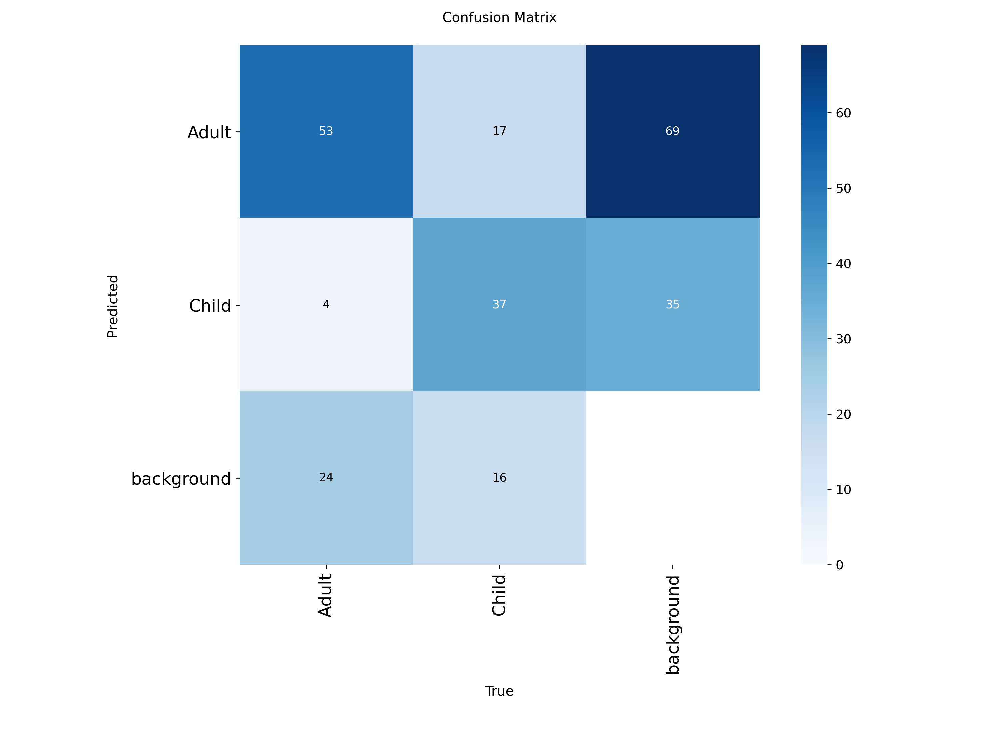

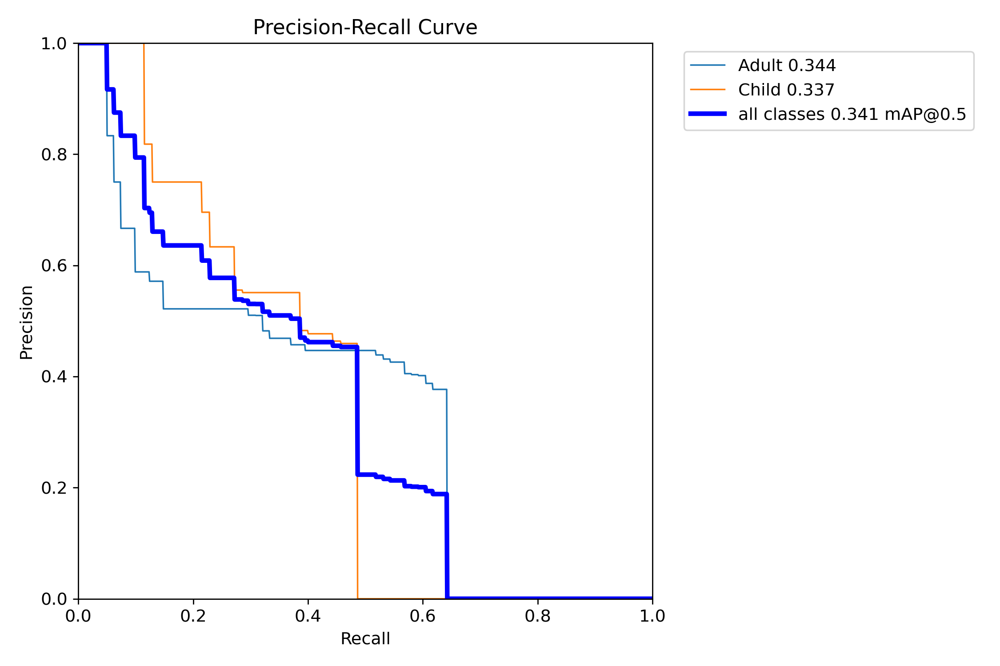

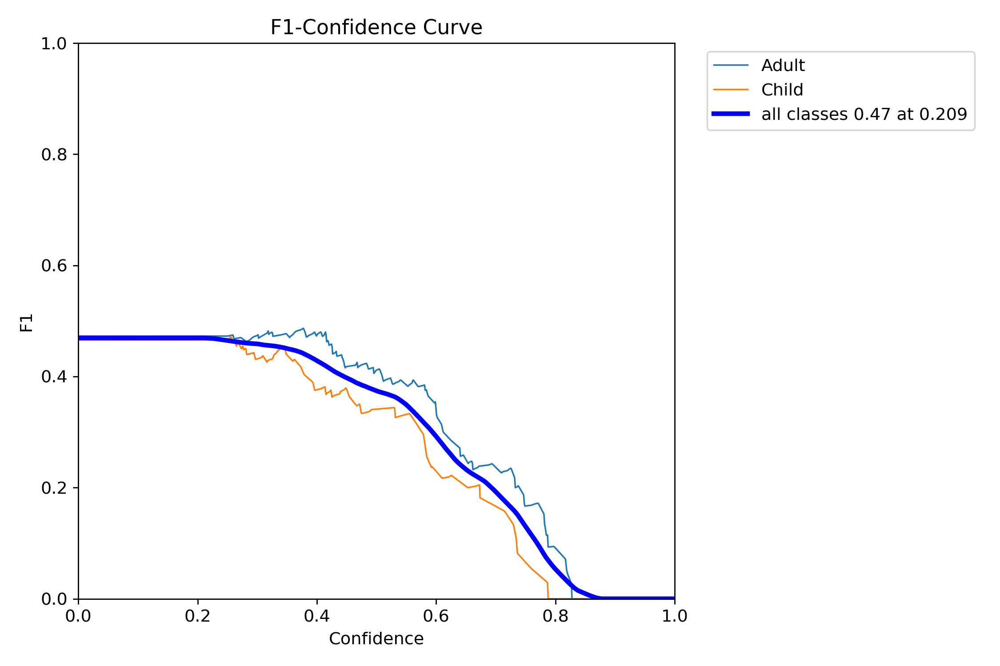

In [ ]:
import os

os.listdir("/content/runs/detect/val-2")


from IPython.display import Image, display

from IPython.display import Image, display

path = "/content/runs/detect/val-3"

display(Image(f"{path}/confusion_matrix.png"))
display(Image(f"{path}/BoxPR_curve.png"))
display(Image(f"{path}/BoxF1_curve.png"))

##Demo

In [ ]:
finder = LostChildFinder(
    model_path="/content/best.pt",
    threshold_meters=2.5,
    use_coco_mode=False
)

finder.process_video(
    "/content/4750093-hd_1920_1080_25fps.mp4",
    "output3.mp4"
)

from IPython.display import Video
Video("output3.mp4", embed=True)

[Model] تحميل /content/best.pt ...
[Model] جاهز ✓


DONE ✔ output3.mp4


In [ ]:
finder = LostChildFinder(
    model_path="/content/best.pt",
    threshold_meters=2.5,
    use_coco_mode=False
)

finder.process_video(
    "/content/8524218-hd_1920_1080_25fps.mp4",
    "output2.mp4"
)

from IPython.display import Video
Video("output2.mp4", embed=True)

[Model] تحميل /content/best.pt ...
[Model] جاهز ✓


DONE ✔ output2.mp4


In [ ]:
finder = LostChildFinder(
    model_path="/content/best.pt",
    threshold_meters=2.5,
    use_coco_mode=False
)

finder.process_video(
    "/content/7981703-uhd_3840_2160_30fps.mp4",
    "output4.mp4"
)

from IPython.display import Video
Video("output4.mp4", embed=True)

In [ ]:
finder = LostChildFinder(
    model_path="/content/best.pt",
    threshold_meters=2.5,
    use_coco_mode=False
)

finder.process_video(
    "/content/8912754-uhd_3840_2160_25fps.mp4",
    "output5.mp4"
)

from IPython.display import Video
Video("output5.mp4", embed=True)